## Chapter 6
# Psychophysical Basis of Sound

In [1]:
import sys
sys.path.append('../')

from Note import Note
from NoteSequence import render_notes_ipython, render_samples_ipython

## The Missing Fundamental

Our brain is hardwired to expect harmonics at integer multiples of a fundamental frequency.  So much so that even if just the harmonics are present, without the fundamental, most will still hear the missing funamental (the greatest common factor of the overtones).

In [2]:
frequencies = [300, 400, 500]
render_notes_ipython([(frequency, 5)] for frequency in frequencies)

Perceived fundamental:

In [3]:
render_notes_ipython((100, 5))

Note that this even happens when the different pitches occur in different ear (use headphones to see):

In [4]:
render_notes_ipython([Note(frequency, 5, pan=i % 2)] for i, frequency in enumerate(frequencies))

This implies that pitch perception must be at least partially due to processing in the brain, and not purely from peripherals of the auditory system like the basilar membrane and lower nerve centers of the auditory cortex.

## Just Noticeable Difference (JND)

In general, for many perceptive phenomena, the greater the magnitude of the stimulus, the greater the amount of change needed to detect a change in stimulus.

Most people can't reliably tell which one of the following series of pairs of tones is higher in pitch than the other:

In [5]:
import numpy as np

reference_tones_with_jnd_ratio = [(400, 1.004), (1_000, 1.005), (5_000, 1.006)]

rendered_tones = []
for reference_tone_with_jnd_ratio in reference_tones_with_jnd_ratio:
    tone_1 = reference_tone_with_jnd_ratio[0]
    tone_2 = reference_tone_with_jnd_ratio[0] * reference_tone_with_jnd_ratio[1]
    tones = [tone_1, tone_2]
    experiment_indices = [0, 1]
    np.random.shuffle(experiment_indices)
    experiment_tones = np.array(tones)[experiment_indices]
    rendered_tones.append(render_notes_ipython([(experiment_tones[0],2), (0,0.4), (experiment_tones[1],2)]))

In [6]:
rendered_tones[0]

In [7]:
rendered_tones[1]

In [8]:
rendered_tones[2]

## Interval Perception

Because a doubling of frequency is perceived as the same "tone" (octave equivalence), listening to an ascension along tone "height" (its place along the scale of JND perception) but whose notes are semitones down "chromatically" (its tonal place withing a single octave), we get the perception of ascension or descension depending on whether we focus on absolute pitch or chroma.

In [9]:
major_seventh_ratio = 2 ** (11/12)
a_hertz = 55
# (also reduce magnitude as frequency increases to take it easier on the ears)
render_notes_ipython([(a_hertz * major_seventh_ratio ** num_sevenths, 1, (8 - num_sevenths) / 8) for num_sevenths in range(8)])

## Shepard Scale Illusion

In [10]:
from scipy.signal import chirp
from conversion import SAMPLES_PER_SECOND
from AR import AR # attack-release envelope

semitone_interval = 2 ** (1/12)
num_octaves = 9
min_freq_hz = 20
max_freq_hz = min_freq_hz * semitone_interval ** (12 * num_octaves)
partial_duration_seconds = 10
partial_duration_samples = int(partial_duration_seconds * SAMPLES_PER_SECOND)
num_partials = 30 # partials are full hearing-range note glisandos that overlap

note_frequencies = [min_freq_hz * semitone_interval ** i for i in range(12 * num_octaves)]
note_duration_seconds = partial_duration_seconds / len(note_frequencies)
note_duration_samples = partial_duration_samples / len(note_frequencies)

# Uncomment for semitones rather than continuous sweeping partials
#partial = render_notes_ipython([(note_frequency, note_duration_seconds) for i, note_frequency in enumerate(note_frequencies)])[0,:]

# Generated enveloped continuous frequency sweep
partial = chirp(np.linspace(0, 10, partial_duration_samples), f0=min_freq_hz, f1=max_freq_hz, t1=10, method='logarithmic')
# get rid of clicks (gausian envelope has nonzero tails)
AR(attack_seconds=0.3, release_seconds=0.3).apply(partial)

# quiet at the beginning and end, and more quiet on the higher frequencies
envelope = np.array(np.hamming(len(partial)) ** 2) * np.logspace(1, 0, len(partial)) ** 2
envelope /= envelope.max()
partial *= envelope

# Changing this `overlap` value has a big effect on the overall sound of the output.
# Exact-octave overlaps were Shepard's original formulation, but changing to smaller
# intervals creates a more dissonant and interesting sound.
overlap_duration_samples = int(note_duration_samples * 12)

all_partials_mixed = np.zeros(len(partial) + (num_partials - 1) * overlap_duration_samples)
for i in range(num_partials):
    all_partials_mixed[i*overlap_duration_samples:i*overlap_duration_samples + len(partial)] += partial
all_partials_mixed /= all_partials_mixed.max()

render_samples_ipython(all_partials_mixed)

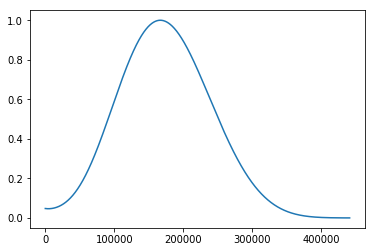

In [11]:
from matplotlib import pyplot as plt
%matplotlib inline
plt.plot(envelope)

## Pitch Shift with Loudness Change

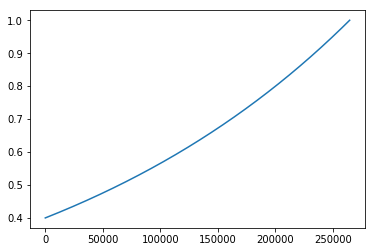

In [12]:
from conversion import linear_to_db, db_to_linear

duration_samples = 6 * SAMPLES_PER_SECOND
envelope = db_to_linear(np.linspace(linear_to_db(40), linear_to_db(100), duration_samples))
envelope /= envelope.max()
plt.plot(envelope)

Louder sounds are generally heard as lower in pitch.  If the intensity of a 100 Hz tone is increased from 40dB to 100 dB SPL, the pitch decreases by about 10 percent.

In [13]:
from generators import generate_sine
render_samples_ipython(generate_sine(100, duration_samples) * envelope)

## Frequency domain masking

When two sinusoids are presented simultaneously, the fainter sinusoid can be rendered inaudible, or masked, by the louder sinusoid if the fainter one lies within a certain frequency range of the louder one.

For example, a 1.5 kHz sinusoid at 35 dB or a 750 Hz sinusoid at 35 dB would be inaudible in the presence of a 1 kHz sinusoid at 60 dB:

In [14]:
duration_samples = 3 * SAMPLES_PER_SECOND
main_tone = generate_sine(1000, duration_samples) * db_to_linear(60)
# I take it even further and still don't hear the masked tone
masked_tone = generate_sine(1500, duration_samples) * db_to_linear(45)
render_samples_ipython(main_tone + masked_tone)

In [15]:
masked_tone = generate_sine(750, duration_samples) * db_to_linear(35)
render_samples_ipython(main_tone + masked_tone)
# huh, I can hear this lower tone even at the low recommended 35 dB.  Frequency masking for my ears seems to be more asymmetric toward the high end (more masking when the masked frequency is higher than the main).

## Combination Tones

Giuseppe Tartini noted in 1754 that when two loud, pure tones are sounded together, a third is sometimes also heard at the difference frequency, $\Delta{f} = f_u - f_l$, where $f_u$ and $f_l$ are the upper and lower frequencies.  For example, 2100 Hz and 2000 Hz produce a difference tone of 100 Hz.

In [16]:
render_notes_ipython([(frequency, 4)] for frequency in [2100, 2000])

In [17]:
# We should be hearing a difference tone sounding like this:
render_notes_ipython((100, 4))
# I must admit I don't distinctly hear this, although I do kind of hear a tone like this maybe a couple octaves higher not present in the original two tones.

## Critical Bands

Zwicker and Feldtkeller (1955) played a narrowband noise signal containing all frequencies between 980 to 1020 Hz. The bandwidth of the signal was 40 Hz, and its band center was 1000 Hz. Then, keeping the band center at 1000 Hz, and keeping the total intensity constant, they gradually increased the bandwidth, spreading the same energy over a larger and larger frequency range.

Subjects reported that the loudness remained constant... but only up to a certain bandwidth, after which perceived loudness began to increase _even though there was no increase in total energy_. With the band center at 1 kHz, loudness began to increase when the bandwidth exceeded about 160 Hz.

It is hypothesized that areas of the basilar membrane respond together to selected frequency ranges - the critical bands.

**This is an important concept and is used for compression in MPEG/MP3 encoding.**

[40, 48, 64, 96, 160, 288, 544, 1056, 2080]


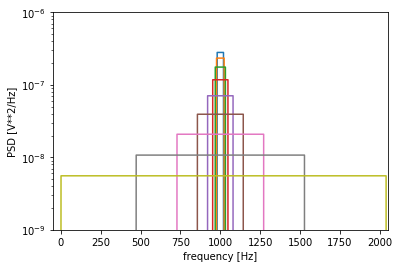

In [18]:
from generators import band_limited_noise

band_center_hz = 1_000
band_widths_hz = [32 + 2 ** i for i in range(3, 12)]
# The last band width is not really symmetric since anything below ~28hz will not contribute to the perceived power, but since this last band bump still ~close~ to doubles the number of new frequencies, its percieved loudness will still increase roughly proportionally.

print(band_widths_hz)
band_limited_white_noise_signals = [band_limited_noise(band_center_hz - band_width_hz / 2, band_center_hz + band_width_hz / 2, SAMPLES_PER_SECOND * 2) for band_width_hz in band_widths_hz]
from scipy.signal import periodogram

for noise_signal in band_limited_white_noise_signals:
    f, Pxx_den = periodogram(noise_signal, SAMPLES_PER_SECOND)
    plt.semilogy(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.xlim([band_center_hz - max(band_widths_hz) / 2 - 10, band_center_hz + max(band_widths_hz) / 2 + 10])
    plt.ylim([1e-9, 1e-6])
    plt.ylabel('PSD [V**2/Hz]')

# prevent clicks
ramp_samples = int(SAMPLES_PER_SECOND * 0.025)
for noise_signal in band_limited_white_noise_signals:
    noise_signal[:ramp_samples] *= np.linspace(0, 1, ramp_samples)
    noise_signal[-ramp_samples:] *= np.linspace(1, 0, ramp_samples)

render_samples_ipython(np.concatenate([noise_signal for noise_signal in band_limited_white_noise_signals]))

All said and done, the percieved loudness of the above clip should start to increase at a steady rate after about halfway through this series (past the critical band limit of 160 hZ).  In other words, the first 5 should sound around the same level, and the last 4 should seem to raise successively in volume.

## Measuring Critical Bands

Zwicker and Fastl (1990) proposed a reasonable approximation of the critical bandwidth for any given center frequency:

In [19]:
def critical_bandwidth_for_frequency(f):
    return 25 + 75 * (1 + 1.4 * (f / 1000) ** 2) ** 0.69

The "bark scale" divides the ear's spectrum into 24 discrete critical bands, encoding the center frequency and bandwidth of each numbered critical band:

### Bark Scale
(Taken from [its Wikipedia page](https://en.wikipedia.org/wiki/Bark_scale))
![](bark_scale.png)

Zwicker and Fastl (1990) also gave an equation for finding the bark number for a frequency:

In [20]:
def bark_number_for_frequency(f):
    return 13 * np.arctan(0.00076 * f) + 3.5 * np.arctan(f / 7500) ** 2

**Let's try to reproduce the Bark chart above:**

Text(0,0.5,'Frequency (Hz)')

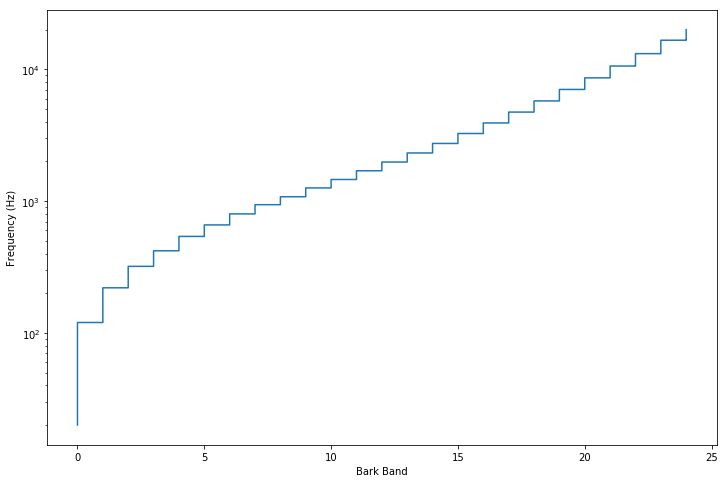

In [21]:
freqency_range = np.linspace(20, 20000, 1000)
plt.figure(figsize=(12, 8))
plt.semilogy(bark_number_for_frequency(freqency_range).astype('int'), freqency_range, drawstyle='steps')
plt.xlabel('Bark Band')
plt.ylabel('Frequency (Hz)')

Things in the chapter but _not_ represented here:
  - _Temporal_ masking (where short sounds close together are perceived as simultaneous or masked)
  - Dependence of percieved intensity on duration
  - A proposed measure of interval consonance/dissonance using cricical band overlaps of harmonics
  - Interaural time difference (spacial source estimation based on arrival time differences between left and right ears)
  - A few other spacial resolution model topics (atomical transfer functions, head movement, reverberence clues, ...)